# Covid Time-Series Data Project

The dataset is a time-series data set of COVID-19 cases in America created by the Johns Hopkins University CSSE Team (https://github.com/CSSEGISandData/COVID-19). This project will be a general exploration of COVID-19 cases throughout 2020 and mainly look to visualize the case numbers and find any patterns. We will be working with a subset containing the data up to Dec 31, 2020. 

In addition to practice, this project will also look at the following questions:

    - Which states are seeing the most COVID-19 cases?
    - Does number of COVID-19 cases follow state population numbers?
    - Which statistics should we be focusing on when we gauge COVID-19 response?
    - How can we best group, summarize and visualize the data?
    
Let's begin by reading in the dataset.

In [116]:
import pandas as pd

covid = pd.read_csv('covid_data.csv')
covid.head(10)

,UID,iso2,iso3,code3,FIPS,Admin2,Province_State,Country_Region,Lat,Long_,...,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20
0,84001001,US,USA,840,1001.0,Autauga,Alabama,US,32.539527,-86.644082,...,3841,3889,3942,3990,3999,4029,4065,4105,4164,4190
1,84001003,US,USA,840,1003.0,Baldwin,Alabama,US,30.727750,-87.722071,...,12155,12321,12521,12666,12708,12825,12962,13172,13392,13601
2,84001005,US,USA,840,1005.0,Barbour,Alabama,US,31.868263,-85.387129,...,1363,1383,1390,1396,1398,1406,1417,1462,1492,1514
3,84001007,US,USA,840,1007.0,Bibb,Alabama,US,32.996421,-87.125115,...,1660,1683,1711,1725,1739,1746,1762,1792,1817,1834
4,84001009,US,USA,840,1009.0,Blount,Alabama,US,33.982109,-86.567906,...,4313,4367,4405,4441,4446,4465,4483,4535,4584,4641
5,84001011,US,USA,840,1011.0,Bullock,Alabama,US,32.100305,-85.712655,...,760,765,770,777,825,827,830,834,846,859
6,84001013,US,USA,840,1013.0,Butler,Alabama,US,31.753001,-86.680575,...,1412,1423,1434,1448,1446,1452,1457,1482,1493,1508
7,84001015,US,USA,840,1015.0,Calhoun,Alabama,US,33.774837,-85.826304,...,8856,8968,9071,9167,9198,9232,9286,9345,9428,9494
8,84001017,US,USA,840,1017.0,Chambers,Alabama,US,32.913601,-85.390727,...,2161,2176,2191,2200,2203,2214,2229,2275,2310,2341
9,84001019,US,USA,840,1019.0,Cherokee,Alabama,US,34.178060,-85.606390,...,1314,1329,1343,1368,1368,1369,1372,1393,1403,1414


## Cleaning the Data

Looking through the first few rows, we can see that the daily number of cases is provided by county in each state. Most of the columns do not give us information we will use, so we will drop them to organize the dataframe. After that, we will group the dataset by 'Province_State' and aggregate the sum for case numbers of each day. 

In [117]:
dropped_columns = ['UID', 'iso2', 'iso3', 'code3', 'FIPS','Country_Region', 'Lat', 'Long_', 'Combined_Key']

covid = covid.drop(dropped_columns, axis = 1)
covid.head()

,Admin2,Province_State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20
0,Autauga,Alabama,0,0,0,0,0,0,0,0,...,3841,3889,3942,3990,3999,4029,4065,4105,4164,4190
1,Baldwin,Alabama,0,0,0,0,0,0,0,0,...,12155,12321,12521,12666,12708,12825,12962,13172,13392,13601
2,Barbour,Alabama,0,0,0,0,0,0,0,0,...,1363,1383,1390,1396,1398,1406,1417,1462,1492,1514
3,Bibb,Alabama,0,0,0,0,0,0,0,0,...,1660,1683,1711,1725,1739,1746,1762,1792,1817,1834
4,Blount,Alabama,0,0,0,0,0,0,0,0,...,4313,4367,4405,4441,4446,4465,4483,4535,4584,4641


In [118]:
import numpy as np
covid_states = covid.groupby('Province_State').agg(np.sum)
covid_states.reset_index(inplace = True)
covid_states = covid_states.drop([2,9,13,14,39,44,52])
covid_states.head(10)

,Province_State,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,...,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20
0,Alabama,0,0,0,0,0,0,0,0,0,...,329811,334569,338801,342426,343458,345628,347897,351804,356820,361226
1,Alaska,0,0,0,0,0,0,0,0,0,...,44463,44828,45104,45104,45479,45781,45909,46092,46483,46986
3,Arizona,0,0,0,0,1,1,1,1,1,...,467215,473273,480319,486935,493041,494337,504423,507222,512489,520207
4,Arkansas,0,0,0,0,0,0,0,0,0,...,205048,207941,211145,213267,213969,214877,216528,219246,222430,225138
5,California,0,0,0,0,2,2,2,2,2,...,1958508,2002494,2040188,2060797,2120610,2156389,2192684,2228332,2261035,2291007
6,Colorado,0,0,0,0,0,0,0,0,0,...,313552,316500,319530,322189,323619,325018,326668,328408,330859,334097
7,Connecticut,0,0,0,0,0,0,0,0,0,...,168960,170705,172743,172743,172743,172743,181200,181967,183663,185708
8,Delaware,0,0,0,0,0,0,0,0,0,...,51623,52235,53015,53653,54473,55057,55488,56189,56596,57456
10,District of Columbia,0,0,0,0,0,0,0,0,0,...,26900,27226,27436,27436,27710,28202,28342,28535,28758,28983
11,Florida,0,0,0,0,0,0,0,0,0,...,1223015,1234399,1247546,1247546,1264588,1271979,1280177,1292252,1306123,1323315


Text(0.5, 1.0, 'Covid-19 Cases by State as of 12/31/2020')

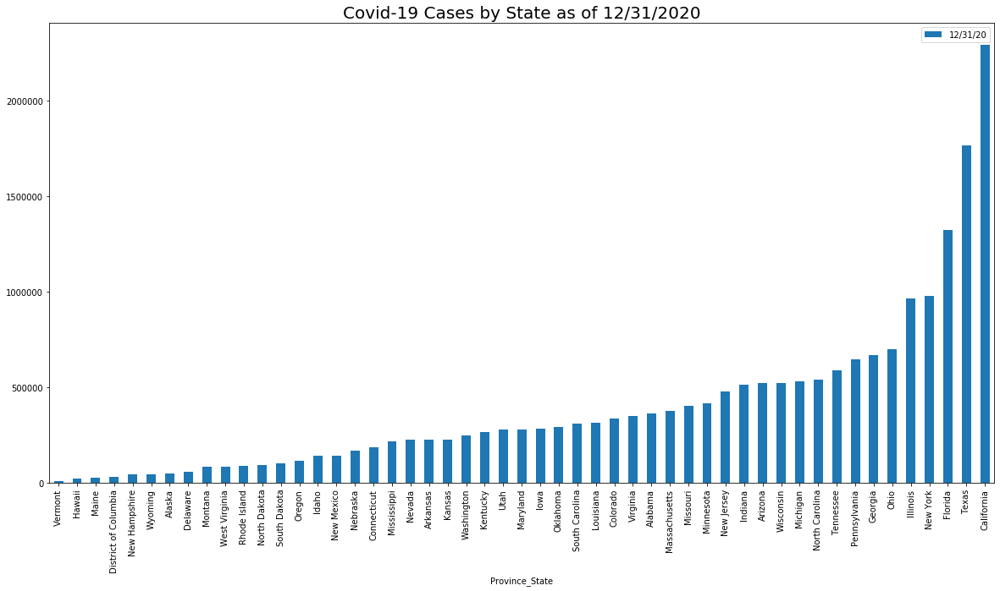

In [119]:
import matplotlib.pyplot as plt
%matplotlib inline
covid_states_ordered = covid_states.sort_values(by=['12/31/20']).copy()
chart = covid_states_ordered.plot(kind = 'bar', x='Province_State', y='12/31/20', title = 'Covid-19 Cases by State as of 12/31/2020' ,figsize=(20,10))
plt.title('Covid-19 Cases by State as of 12/31/2020', fontsize = 20)

We can see that California, Texas, and Florida have the most cases by a significant margin when compared to the other states. Here is a list of the 10 most populated American States:

    California (Population: 39,747,267)
    Texas (Population: 29,087,070)
    Florida (Population: 21,646,155)
    New York (Population: 19,491,339)
    Pennsylvania (Population: 12,813,969)
    Illinois (Population: 12,700,381)
    Ohio (Population: 11,718,568)
    Georgia (Population: 10,627,767)
    North Carolina (Population: 10,497,741)
    Michigan (Population: 10,020,472)

The ten most populated states also seem to be the states with the most Covid-19 cases, the only exception being Michigan which is 11th in cases. Tennessee which is 16th in population is 9th in number of cases, which seems to be an oddity. 

To see if the trend of Covid-19 cases follows population we can also look at the states with the least amount of cases. Here is a list of the 10 least populated American States(not including territories):

    Wyoming (Population: 572,381)
    Vermont (Population: 627,180)
    District of Columbia* (Population: 711,571)
    Alaska (Population: 735,720)
    North Dakota (Population: 760,900)
    South Dakota (Population: 892,631)
    Delaware (Population: 975,033)
    Rhode Island (Population: 1,056,738)
    Montana (Population: 1,074,532)
    Maine (Population: 1,342,097)
    
Out of the least populated states, 7 of them are in the bottom 10 of states with most Covid-19 cases, with Rhode Island, North Dakota and South Dakota being 11th, 12th and 13th, respectively, in least number of Covid-19 cases. 

To look further into this, we will look at the correlation between case numbers and population by bringing in a dataset with state populations and making a scatter plot. 

In [120]:
#create slice of main set
cases_initial = covid_states[['Province_State','12/31/20']]
cases_initial.head()

,Province_State,12/31/20
0,Alabama,361226
1,Alaska,46986
3,Arizona,520207
4,Arkansas,225138
5,California,2291007


In [121]:
#read in file and merge with slice 
us_population = pd.read_csv('uspopulation.csv')
cases_2020 = cases_initial.merge(us_population, how='left', on='Province_State')
cases_2020.head()

,Province_State,12/31/20,Population
0,Alabama,361226,4903185
1,Alaska,46986,731545
2,Arizona,520207,7278717
3,Arkansas,225138,3017804
4,California,2291007,39512223


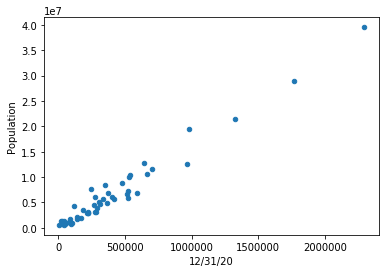

In [122]:
cases_2020.plot.scatter(x='12/31/20', y='Population')

Looking at a scatter plot of the case numbers against each state's population, we can see that there is a strong positive corrrelation between case numbers and state population. 

It makes sense that the states with the most people have the most number of cases, and the states with the least number of people have the least cases. However, does the number of cases best show the impact that COVID-19 has had on each state?

## Covid-19 Cases Impact

Although we can see that states with smaller populations have fewer case numbers, we will need to look at case numbers by population. The CDC has a table that keeps each state's average daily cases per 100k people in the last 7 days (https://covid.cdc.gov/covid-data-tracker/#cases_casesper100klast7days). Here are the top 10 on 12/31/2020:

    California - 91.9
    Tennessee - 82.8
    Rhode Island - 79.3
    Arizona - 77
    Oklahoma - 76.1
    Arkansas - 68.6
    West Virginia - 66.1
    New York* - 65
    Alabama - 64.8
    Delaware - 64

While some familiar names are at the top of the list, it is surprising to see some of the least populated states in the top 10. Tennessee is 16th in population, 9th in case numbers, but 2nd in cases per 100k. 

What's even more surprising is that Rhode Island is 44th in population, 40th in case numbers, but was 3rd in cases per 100k in the last 7 days. Delaware follows a similar pattern despite having less than 1,000,000 people in the state. Why could this possibly be?

Looking into Rhode Island specifically, a population density map shows that the many people live in a relatively close geographical location. 

## Rhode Island Geographical Analysis 

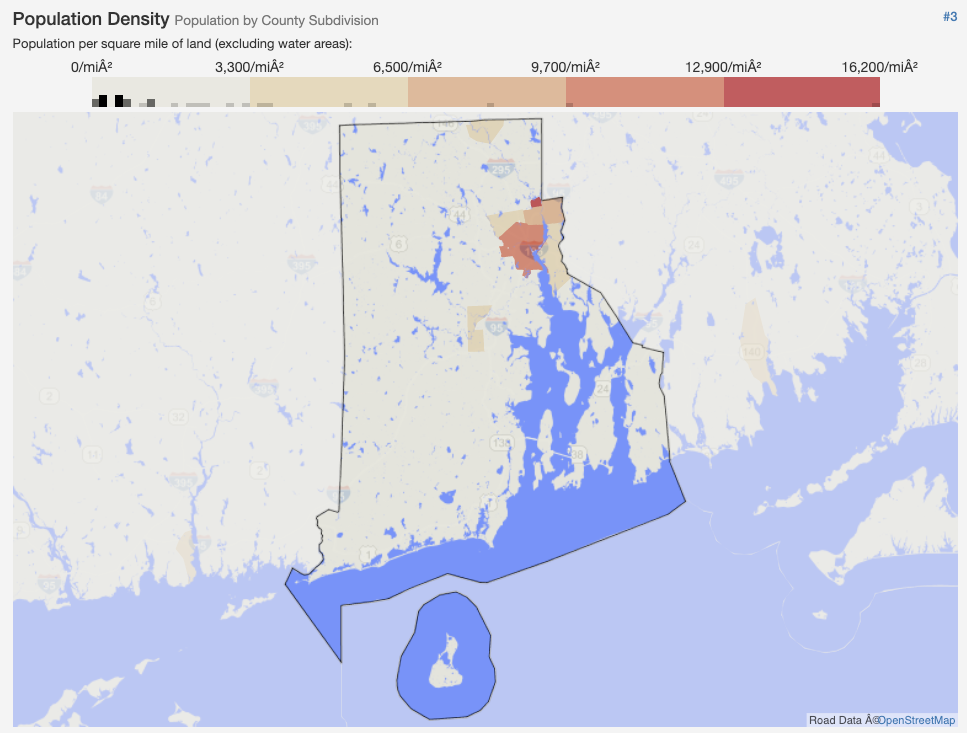

The 5 biggest cities in Rhode Island are:

    1) Providence (Population: 178,850)
    2) Warwick (Population: 81,880)
    3) Cranston (Population: 80,880)
    4) Pawtucket (Population: 71,390)
    5) E Providence (Population: 47,260)
    
All 5 of these cities are in or next to the big shaded area. 
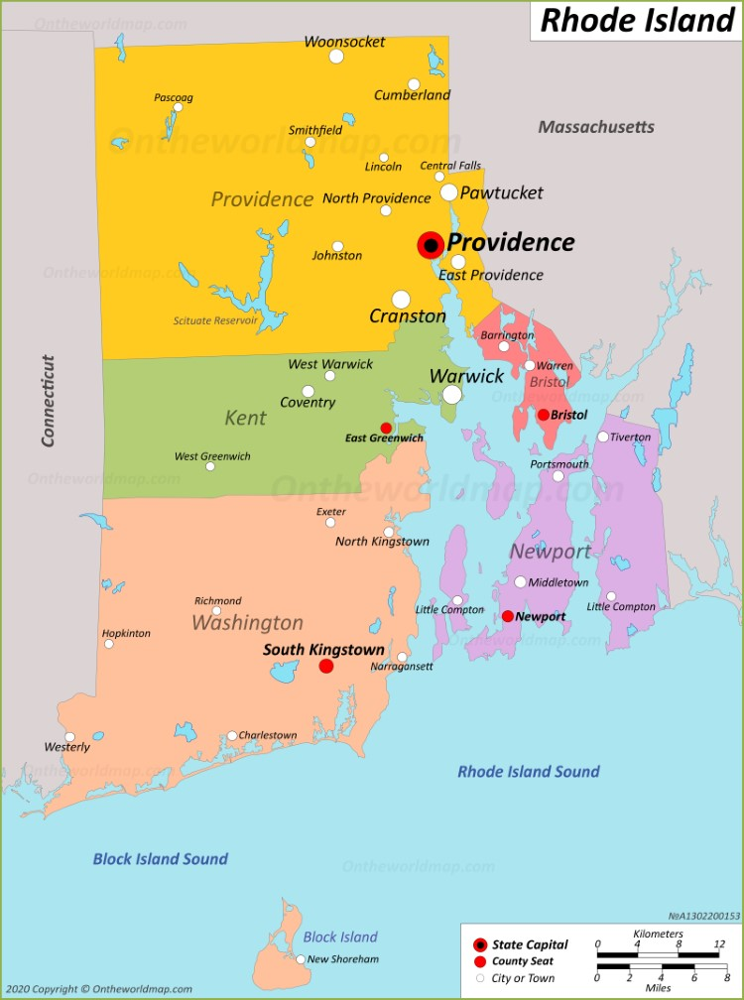

Another interesting city to note is Central Falls, which is 7th in population (19,370) but 1st in population density at 16,160 people per sq mile. The total population of these 6 cities in 479,640, or 45.38% of the total population of 1,056,738. Essentially, almost half of the people in the state live in a geographical location that makes up at most 20% of the state. Due to how close all the biggest cities are, it makes sense that Rhode Island has an abnormally high cases per 100k because half of the people in the state live in the same area and likely travel between the area as well. 

Since so many of the people live in the same area, they also likely have more chances to be exposed to COVID-19 due to the geographical closeness. 

In [123]:
ri_cols = ['Admin2', 'Province_State', '12/31/20']
covid[ri_cols][covid['Province_State']== 'Rhode Island']

,Admin2,Province_State,12/31/20
2478,Bristol,Rhode Island,2403
2479,Kent,Rhode Island,9901
2480,Newport,Rhode Island,2595
2481,Out of RI,Rhode Island,0
2482,Providence,Rhode Island,58946
2483,Unassigned,Rhode Island,9622
2484,Washington,Rhode Island,4482


Looking at the data for Rhode Island, we can see that the majority of cases are in the Providence County with a total of 58,946 cases as 12/31/2020. 5 of the 6 cities that we looked at are in the Providence county. The city of Warwick is in Kent County, which is the 2nd highest county at 9,901 total cases. Looking at Bristol, Newport and Washington Counties, we can see that the cases are noticeably lower than the other two counties. 

While we cannot say for sure why Rhode Island had such a high 'Daily Cases per 100k in last 7 Days', the geographical proximity of its major cities likely played a role. 

## Importance of Daily Tracking

This focus on Rhode Island revealed the limitations of the information we can derive from data. I was surprised by Rhode Island's place on that list and would never have known from just looking at widely-available case and death counts. It is important to not only look at these numbers relative to state populations, but also compared to their previous numbers. Looking at the change in daily new cases will help gauge a state's overall progress. 

We will look at the 5 states with the most cases and create a function that calculates the number of new cases per day in December 2020.


In [124]:
top_5 = covid_states.loc[[5,11,17,36,49], '11/26/20':'12/31/20']
states_names = ['California', 'Florida', 'Illinois', 'New York', 'Texas']
top_5.insert(loc=0, column = 'State', value = states_names)
top_5.set_index('State')

,11/26/20,11/27/20,11/28/20,11/29/20,11/30/20,12/1/20,12/2/20,12/3/20,12/4/20,12/5/20,...,12/22/20,12/23/20,12/24/20,12/25/20,12/26/20,12/27/20,12/28/20,12/29/20,12/30/20,12/31/20
State,,,,,,,,,,,,,,,,,,,,,
California,1171802,1185576,1200624,1215455,1230264,1246042,1265182,1286550,1310307,1337941,...,1958508,2002494,2040188,2060797,2120610,2156389,2192684,2228332,2261035,2291007
Florida,961676,979020,985297,992660,999319,1008166,1018160,1029030,1039207,1049638,...,1223015,1234399,1247546,1247546,1264588,1271979,1280177,1292252,1306123,1323315
Illinois,697489,705063,712936,720114,726304,738846,748603,759562,770088,779975,...,911308,918070,925107,930849,934142,937909,942362,948006,955380,963389
New York,628024,636302,643163,648641,656413,663500,671635,681783,693629,704683,...,876281,886813,899837,912885,924014,932022,940290,950473,963390,978783
Texas,1254822,1259695,1265711,1277981,1290057,1305005,1325369,1344713,1359516,1373354,...,1626614,1648569,1659409,1662724,1668138,1690986,1700549,1730084,1750250,1766307


In [125]:
dates = ['11/26/20','11/27/20', '11/27/20',
       '11/28/20', '11/28/20', '11/29/20', '11/29/20', '11/30/20', '11/30/20', '12/1/20', '12/1/20', '12/2/20', '12/2/20', '12/3/20', '12/3/20',
       '12/4/20', '12/4/20', '12/5/20', '12/5/20', '12/6/20', '12/6/20', '12/7/20', '12/7/20', '12/8/20', '12/8/20', '12/9/20', '12/9/20',
       '12/10/20', '12/10/20', '12/11/20', '12/11/20', '12/12/20', '12/12/20', '12/13/20', '12/13/20', '12/14/20', '12/14/20', '12/15/20', '12/15/20',
       '12/16/20', '12/16/20', '12/17/20', '12/17/20', '12/18/20', '12/18/20', '12/19/20', '12/19/20', '12/20/20', '12/20/20', '12/21/20', '12/21/20',
       '12/22/20', '12/22/20', '12/23/20', '12/23/20', '12/24/20', '12/24/20', '12/25/20', '12/25/20', '12/26/20', '12/26/20', '12/27/20', '12/27/20',
       '12/28/20', '12/28/20', '12/29/20', '12/29/20', '12/30/20','12/30/20','12/31/20']

def divide_chunks(l, n): 
      
    for i in range(0, len(l), n):  
        yield l[i:i + n] 

n = 2
  
dates_grouped = list(divide_chunks(dates, n)) 
dates_grouped

[['11/26/20', '11/27/20'],
 ['11/27/20', '11/28/20'],
 ['11/28/20', '11/29/20'],
 ['11/29/20', '11/30/20'],
 ['11/30/20', '12/1/20'],
 ['12/1/20', '12/2/20'],
 ['12/2/20', '12/3/20'],
 ['12/3/20', '12/4/20'],
 ['12/4/20', '12/5/20'],
 ['12/5/20', '12/6/20'],
 ['12/6/20', '12/7/20'],
 ['12/7/20', '12/8/20'],
 ['12/8/20', '12/9/20'],
 ['12/9/20', '12/10/20'],
 ['12/10/20', '12/11/20'],
 ['12/11/20', '12/12/20'],
 ['12/12/20', '12/13/20'],
 ['12/13/20', '12/14/20'],
 ['12/14/20', '12/15/20'],
 ['12/15/20', '12/16/20'],
 ['12/16/20', '12/17/20'],
 ['12/17/20', '12/18/20'],
 ['12/18/20', '12/19/20'],
 ['12/19/20', '12/20/20'],
 ['12/20/20', '12/21/20'],
 ['12/21/20', '12/22/20'],
 ['12/22/20', '12/23/20'],
 ['12/23/20', '12/24/20'],
 ['12/24/20', '12/25/20'],
 ['12/25/20', '12/26/20'],
 ['12/26/20', '12/27/20'],
 ['12/27/20', '12/28/20'],
 ['12/28/20', '12/29/20'],
 ['12/29/20', '12/30/20'],
 ['12/30/20', '12/31/20']]

In [126]:
differences = []
for date1,date2 in dates_grouped:
    difference = top_5[date2] - top_5[date1]
    differences.append(difference)
    
diff_per_day = pd.DataFrame(data = differences)
diff_per_day.columns = states_names

dates_col = []
for date1, date2 in dates_grouped:
    date_col = date2
    dates_col.append(date_col)
    
diff_per_day.insert(loc=0, column = 'New Cases', value = dates_col)
diff_per_day.head(10)


,New Cases,California,Florida,Illinois,New York,Texas
0,11/27/20,13774,17344,7574,8278,4873
1,11/28/20,15048,6277,7873,6861,6016
2,11/29/20,14831,7363,7178,5478,12270
3,11/30/20,14809,6659,6190,7772,12076
4,12/1/20,15778,8847,12542,7087,14948
5,12/2/20,19140,9994,9757,8135,20364
6,12/3/20,21368,10870,10959,10148,19344
7,12/4/20,23757,10177,10526,11846,14803
8,12/5/20,27634,10431,9887,11054,13838
9,12/6/20,28732,8436,7598,10151,11959


## Visualizing Daily Case Numbers

In order to see how these states' daily case numbers varied throughout December, we will graph them with scatter plots. We will graph 

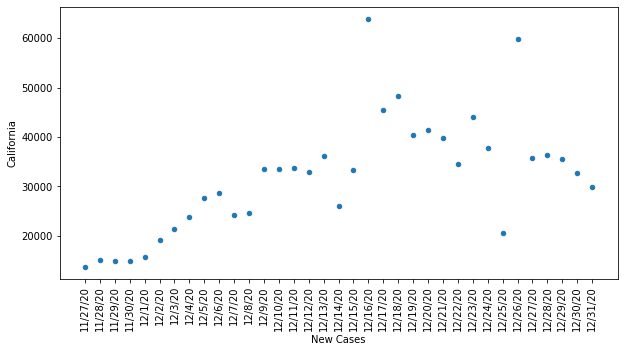

In [127]:
diff_per_day.plot(kind = 'scatter', x='New Cases', y ='California', rot = 90, figsize=(10,5))

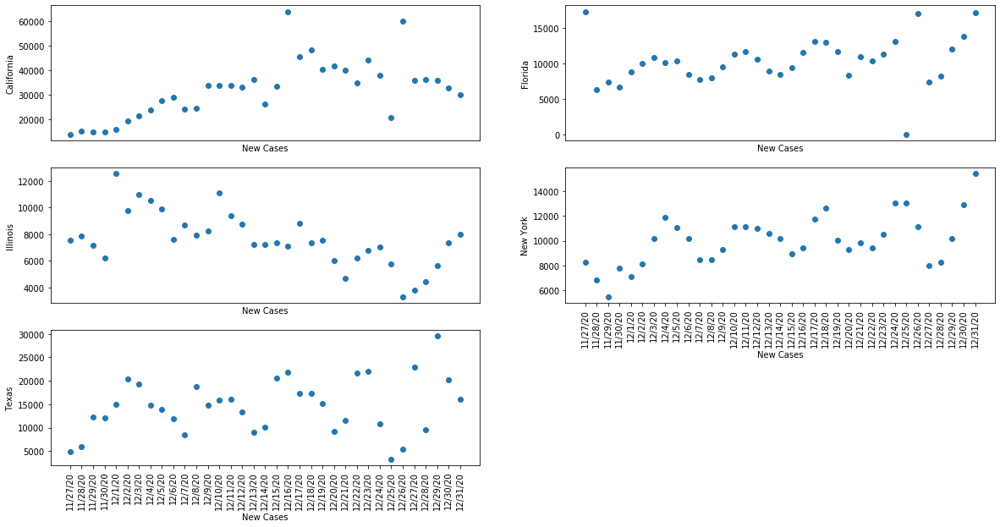

In [128]:
fig = plt.figure(figsize=(20,10))

for i in range(0,5):
    states = ['California', 'Florida', 'Illinois', 'New York', 'Texas']

    ax = fig.add_subplot(3,2,i+1)
    ax.scatter(diff_per_day['New Cases'], diff_per_day[states[i]])
    ax.set_xlabel('New Cases')
    ax.set_ylabel(states[i])
    plt.xticks(rotation=90)
    if i == 1 or i == 0 or i == 2:
        plt.xticks([])
        


    

Looking at these scatter plots, we can see that except for California, each state had an almost sinusoidal pattern for case numbers trending either upwards or downwards. However, it is also apparent that the graphs also have moderate at best correlations showing that at the end of 2020, states were still struggling to maintain constant case levels.

When looking at scaled versions of these scatter plots, we can see that California's spike in cases does not show a pattern that does not look too different of the other states. However, with California's high population, the scaled version of the graph decreases the impact of California's case spike. While case numbers may have gone up around 50% to 100% for all 5 of these states, those percentage increases are significantly more in California due to how many people there are. 

It is also interesting to note that every state had a moderate spike around 12/10/2020, which is around two weeks after Thanksgiving. Also, Florida's pattern is almost a perfect sinusoid which is intriguing given that the news report that Florida had asked data scientists to manipulate the data was released about a month after. 

To get a better understanding of the situation in California, we will create a function that calculates the number of new cases in each month and graph COVID-19 cases in California by month. 

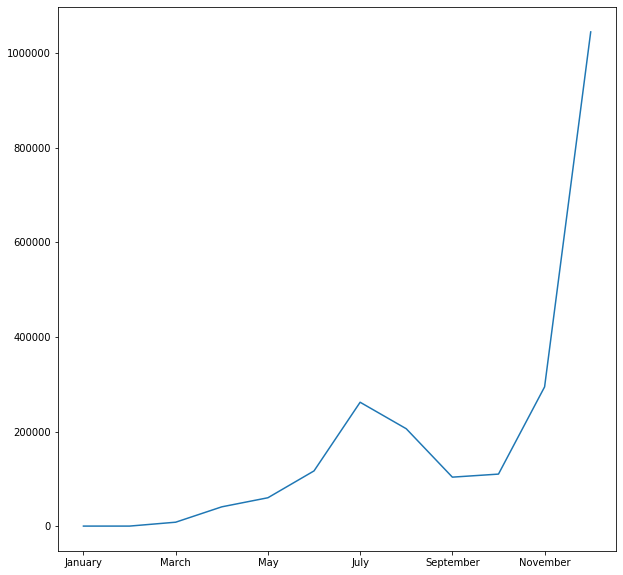

In [129]:
month_dates = ['1/22/20', '1/31/20','2/1/20','2/29/20', '3/1/20','3/31/20','4/1/20','4/30/20','5/1/20','5/31/20','6/1/20','6/30/20','7/1/20',
               '7/31/20','8/1/20','8/31/20','9/1/20','9/30/20','10/1/20','10/31/20','11/1/20','11/30/20','12/1/20','12/31/20']

months = list(divide_chunks(month_dates, n))


covid_by_month = covid_states['Province_State']
new_cases = pd.DataFrame(covid_by_month)

month_names = ['January', 'February', 'March', 'April', 'May', 'June',
          'July','August','September','October','November','December']

total_cases_month = []

for beg_date, end_date in months:
    total_month = covid_states[end_date] - covid_states[beg_date]
    total_cases_month.append(total_month)

for i in range(0,12):
    new_cases[month_names[i]] = total_cases_month[i]

new_cases = new_cases.set_index('Province_State')
new_cases.loc['California'].plot(kind='line', figsize=(10,10))

The scatter plot better shows the steep increase in new cases in California during December. The importance of relative and scaled numbers cannot be understated and is shown looking at these statistics. Many have struggled to understand the depth and sheer amount of COVID-19 cases, and I hope that understanding and visualizing these statistics will bridge those gaps. 


## Visualizing the Numbers

While there are many insights in the data, being able to visualize and show this information is even more important. We will create a function to assign a region to each state and see if the population trend is also evident in each US Region. 

In addition to this, we have seen the importance of using scaled statistics in seeing the whole impact. While we can look at the case numbers for each state, one important aspect to consider is the case numbers relative to the population of each state. The CDC has a dataset that keeps scaled statistics such as "Case Rate Per 100000". We will read in and clean the file, then combine it with the 'cases_2020' table to create a summary table. 

In [130]:
#assign a region to each state
def get_region(state):
    northeast = ['Maine', 'New Hampshire', 'Vermont', 'Massachusetts',
                 'Rhode Island', 'Connecticut', 'New York','New Jersey', 'Pennsylvania', 'District of Columbia']
    midwest = ['Ohio', 'Michigan', 'Indiana', 'Wisconsin', 'Illinois', 'Minnesota',
               'Iowa', 'Missouri' ,'North Dakota', 'South Dakota', 'Nebraska', 'Kansas']
    south = ['Delaware', 'Maryland', 'Virginia', 'West Virginia', 'Kentucky' ,'North Carolina', 'South Carolina',
             'Tennessee' ,'Georgia', 'Florida', 'Alabama' ,'Mississippi' ,'Arkansas', 'Louisiana' ,'Texas', 'Oklahoma']
    west = ['Montana', 'Idaho', 'Wyoming' ,'Colorado' ,'New Mexico', 'Arizona' ,
            'Utah', 'Nevada', 'California', 'Oregon', 'Washington', 'Alaska', 'Hawaii']
    region = ''
    
    if state in northeast:
        region = 'Northeast'
    elif state in midwest:
        region = 'Midwest'
    elif state in south:
        region = 'South'
    elif state in west:
        region = 'West'
    return region 

regions = cases_2020['Province_State'].apply(get_region)
cases_2020.insert(loc= 1, column='Region', value = regions)
cases_2020.head()

,Province_State,Region,12/31/20,Population
0,Alabama,South,361226,4903185
1,Alaska,West,46986,731545
2,Arizona,West,520207,7278717
3,Arkansas,South,225138,3017804
4,California,West,2291007,39512223


In [131]:
cases_scaled = pd.read_csv('cdc_file.csv')

#drop unnecessary columns and rows with territories
cs_dropped_columns = ['Total Cases', 'Confirmed Cases', 'Probable Cases', 'Confirmed Deaths', 'Probable Deaths', 'Deaths in Last 7 Days', 'Death Rate per 100000', 'Death Rate per 100K in Last 7 Days']
cases_scaled = cases_scaled.drop(columns=cs_dropped_columns)
cases_scaled = cases_scaled.drop([3, 11, 13, 28, 35, 44, 45, 47, 54, 60])
cases_scaled.reset_index(inplace=True)
cases_scaled = cases_scaled.drop(columns='index')

cases_scaled.head()

,State/Territory,Cases in Last 7 Days,Case Rate per 100000,Total Deaths,Case Rate per 100000 in Last 7 Days
0,Alaska,2272,6324,214,44.4
1,Alabama,26000,7535,4872,75.8
2,Arkansas,17473,7669,3729,82.7
3,Arizona,46109,7407,9061,90.5
4,California,273244,5937,26357,98.8


In [132]:
#rename columns
cases_2020 = cases_2020.rename(columns={'12/31/20':'Total Cases 2020', 'Province_State': 'State/Territory'})

covid_summary = cases_2020.merge(cases_scaled, how='left', on='State/Territory')
covid_summary.head()

,State/Territory,Region,Total Cases 2020,Population,Cases in Last 7 Days,Case Rate per 100000,Total Deaths,Case Rate per 100000 in Last 7 Days
0,Alabama,South,361226,4903185,26000.0,7535.0,4872.0,75.8
1,Alaska,West,46986,731545,2272.0,6324.0,214.0,44.4
2,Arizona,West,520207,7278717,46109.0,7407.0,9061.0,90.5
3,Arkansas,South,225138,3017804,17473.0,7669.0,3729.0,82.7
4,California,West,2291007,39512223,273244.0,5937.0,26357.0,98.8


Now that we have a summary table, we can see if case trends also follow population in terms of regions. We will use pivot tables to make bar charts of Total Cases 2020, Case Rate per 100000 and Total Deaths. 

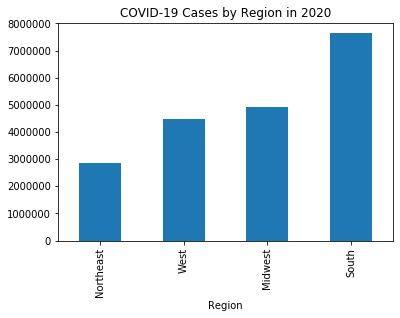

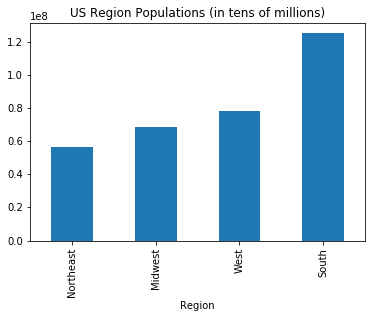

In [133]:
#make pivot table by region of COVID-19 Cases
import numpy as np
pv_covid_states = covid_summary.pivot_table(values='Total Cases 2020', index = 'Region', aggfunc = np.sum)
pv_covid_states.sort_values(by=['Total Cases 2020']).plot(kind='bar', title='COVID-19 Cases by Region in 2020', legend = False)
pv_covid_states

#make pivot table by region of population
pv_pop = covid_summary.pivot_table(values='Population', index='Region', aggfunc = np.sum)
pv_pop.sort_values(by=['Population']).plot(kind='bar', title='US Region Populations (in tens of millions)', legend = False)

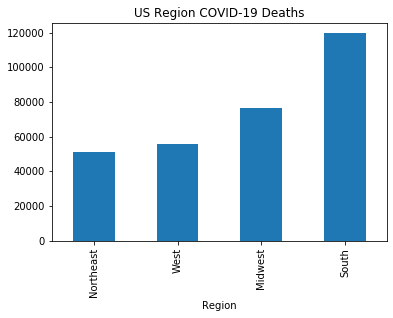

In [134]:
pv_deaths = covid_summary.pivot_table(values='Total Deaths', index='Region', aggfunc = np.sum)
pv_deaths.sort_values(by=['Total Deaths']).plot(kind='bar', title='US Region COVID-19 Deaths', legend = False)

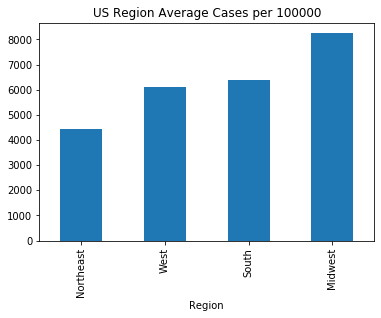

In [135]:
pv_case_rate = covid_summary.pivot_table(values='Case Rate per 100000', index='Region', aggfunc = np.mean)
pv_case_rate.sort_values(by=['Case Rate per 100000']).plot(kind='bar', title='US Region Average Cases per 100000', legend = False)

We can see that the charts of Total Cases and Total Deaths follow the same pattern as the Population graphs. The South has a significant gap between the Midwest and West, and the Northeast comes last. 

What was interesting to see was that the only difference was in the graph of Average Cases per 100000, for which the Midwest had the highest average. This indicates that although the South has the most cases, the Midwest has more cases relative to its population. While the reasons for this could vary from government response to cultural characteristics, it is apparent that scaled statistics provide foundational insight into COVID-19 impact. 

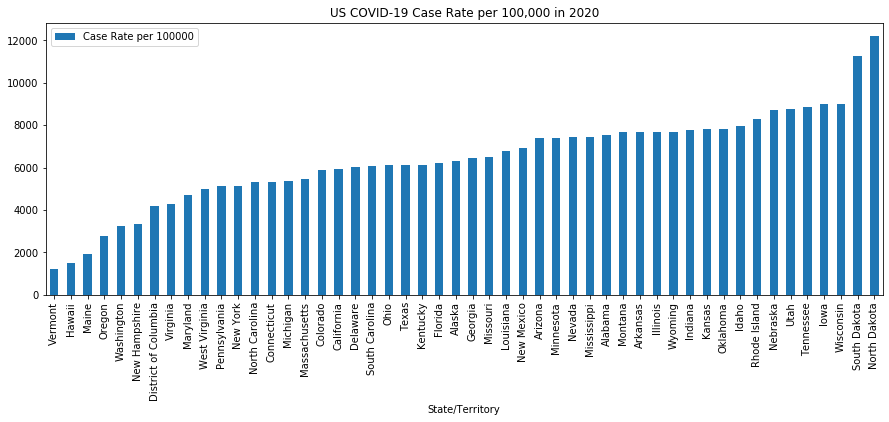

In [136]:
cases_100 = covid_summary.sort_values(by=['Case Rate per 100000'])
cases_100 = cases_100.drop(30)
cases_100.plot(kind='bar', x='State/Territory', y='Case Rate per 100000', figsize=(15,5), title = 'US COVID-19 Case Rate per 100,000 in 2020')

Looking at the chart, we can see that the list of states that have the highest case rate per 100,000 is quite different from the states with the most overall cases. 

5 States with Most Cases:                                        
    - California
    - Texas
    - Florida
    - New York
    - Illinois
    
5 States with Highest Case Rate per 100,000:
    - North Dakota
    - South Dakota
    - Florida
    - Iowa
    - Tennessee
    
The US has commonly looked at the states with the most cases as the biggest points of focus. However, looking at these numbers we can see that there are many states whose numbers are more alarming relative to the population of the state. Looking at California, we can see that while it has the most COVID-19 cases, it is not even in the top 50% for case rate per 100,000. It will be important to determine why these states have been impacted so much

## Using bar_chart_race to show the numbers

In order to better visualize the case numbers over the past year, we will be using bar_chart_race, a visualization tool created by tdpetrou (https://github.com/dexplo/bar_chart_race). It requires data to be in a wide format, so we will change the data to be in the correct form. First, we will transpose the dataset so that the the dates are the column titles and replace the 0 values with np.nan values.

In [137]:
covid_states_transposed = covid_states.transpose()
covid_states_transposed.head(5)

,0,1,3,4,5,6,7,8,10,11,...,47,48,49,50,51,53,54,55,56,57
Province_State,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [138]:
#set column names to states
covid_states_transposed.columns = covid_states_transposed.iloc[0]
covid_states_transposed.columns.name = None

#drop 1st row
covid_states_transposed = covid_states_transposed.drop('Province_State')

#replace 0 with np.nan
covid_states_transposed = covid_states_transposed.replace(0, np.nan)

#make columns numeric 
d_columns = covid_states_transposed.columns.tolist()
for col in d_columns:
    covid_states_transposed[col] = pd.to_numeric(covid_states_transposed[col], errors = 'coerce')

covid_states_transposed.head(5)

,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District of Columbia,Florida,...,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
1/22/20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN
1/23/20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN
1/24/20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN
1/25/20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN
1/26/20,NaN,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN


In [139]:
import bar_chart_race as bcr
bcr_test = covid_states_transposed.iloc[45:345]
bcr.bar_chart_race(bcr_test, title='Covid', n_bars = 25)

/opt/anaconda3/lib/python3.7/site-packages/bar_chart_race/_make_chart.py:226: UserWarning: Some of your columns never make an appearance in the animation. To reduce color repetition, set `filter_column_colors` to `True`
  warnings.warn("Some of your columns never make an appearance in the animation. "


## Conclusion

In review, we looked through the data set to better understand how and where COVID-19 was affecting America. We found that the states with the most COVID-19 cases were generally the states with the largest populations. However, we also found that we needed to look at scaled statistics to truly see the impact of COVID-19 in each state. We created a function to find number of new cases per day, which truly showed the volatility and differences between the biggest states. 

In terms of the introductory questions, we saw that states like California and Texas had the most COVID-19 cases but that North and South Dakota had the most cases relative to state population. We also saw that the distribution of COVID-19 cases generally followed the same distribution as state populations. However, there were a few states that had high absolute and relative case numbers that didn't follow this trend, and require further research. We should be focusing more on scaled and self-tracking statistics to gauge how effective our response to COVID-19 has been.

Finally, visualizing our data helped show that the Midwest was seeing higher cases relative to population and the importance of comparing absolute and scaled statistics. It also helps track progress and just understand how the situation has evolved throughout 2020. 